In [1]:
import os, numpy as np, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path

from sklearn.pipeline         import make_pipeline, Pipeline
from sklearn.preprocessing    import StandardScaler, PolynomialFeatures
from sklearn.model_selection  import GridSearchCV, TimeSeriesSplit
from sklearn.metrics          import mean_squared_error
from sklearn.linear_model     import Ridge, Lasso, ElasticNet
from sklearn.ensemble         import GradientBoostingRegressor, RandomForestRegressor
from sklearn.svm              import SVR
from sklearn.neural_network   import MLPRegressor
from sklearn.base             import clone

%matplotlib inline


In [2]:
MERGED_DIR = Path("merged_energy_temp")
MAX_LAG    = 3          # days
N_SPLITS   = 5          # for TimeSeriesSplit
N_POINTS   = 300        # points to show in plots (None = full test)

def make_features(df: pd.DataFrame, max_lag: int = MAX_LAG):
    """Add lags + seasonal sin/cos; return same df (mutates)."""
    for lag in range(1, max_lag + 1):
        df[f"Temp_lag{lag}"] = df["Estimated_Temp_C"].shift(lag)
    doy = df.index.dayofyear
    df["sin_DOY"] = np.sin(2 * np.pi * doy / 365.25)
    df["cos_DOY"] = np.cos(2 * np.pi * doy / 365.25)
    return df


In [3]:
files = sorted(MERGED_DIR.glob("*_merged.csv"))
assert files, f"No *_merged.csv found in {MERGED_DIR.resolve()}"

data_dict = {}
for csv_path in files:
    region = csv_path.stem.split("_")[0]        # e.g. "AEP"
    df     = pd.read_csv(csv_path, index_col=0, parse_dates=True)

    energy_col = df.columns[0]
    df = df.rename(columns={energy_col: "Energy"})
    df["Estimated_Temp_C"] = df["Estimated_Temp_C"].astype(float)

    df = make_features(df).dropna().sort_index()

    y = df["Energy"].values
    feature_cols = ["Estimated_Temp_C", *(f"Temp_lag{i}" for i in range(1, MAX_LAG+1)),
                    "sin_DOY", "cos_DOY"]
    X = df[feature_cols].values

    split = int(len(df) * 0.8)
    data_dict[region] = {
        "X_train": X[:split],  "y_train": y[:split],
        "X_test":  X[split:],  "y_test":  y[split:],
        "index_test": df.index[split:]
    }

print(f"Loaded data for {len(data_dict)} regions: {list(data_dict)}")


Loaded data for 12 regions: ['AEP', 'COMED', 'DAYTON', 'DEOK', 'DOM', 'DUQ', 'EKPC', 'FE', 'NI', 'PJM', 'PJME', 'PJMW']


In [4]:
def tuned_linear_models(X_tr, y_tr):
    """
    Returns a dict of tuned Ridge, Lasso, ElasticNet + a polynomial Ridge model,
    trained on the supplied training split.
    """
    tscv = TimeSeriesSplit(n_splits=N_SPLITS)

    # ===== Ridge ==========================================================
    ridge_pipe = make_pipeline(StandardScaler(),
                               Ridge(max_iter=100_000, random_state=42))
    ridge_grid = {"ridge__alpha": np.logspace(-3, 3, 13)}
    ridge_best = GridSearchCV(ridge_pipe, ridge_grid,
                              scoring="neg_root_mean_squared_error",
                              cv=tscv, n_jobs=-1).fit(X_tr, y_tr).best_estimator_

    # ===== Lasso ==========================================================
    lasso_pipe = make_pipeline(StandardScaler(),
                               Lasso(max_iter=100_000, random_state=42))
    lasso_grid = {"lasso__alpha": np.logspace(-3, 0, 7)}
    lasso_best = GridSearchCV(lasso_pipe, lasso_grid,
                              scoring="neg_root_mean_squared_error",
                              cv=tscv, n_jobs=-1).fit(X_tr, y_tr).best_estimator_

    # ===== ElasticNet =====================================================
    enet_pipe = make_pipeline(StandardScaler(),
                              ElasticNet(max_iter=100_000, random_state=42))
    enet_grid = {"elasticnet__alpha": np.logspace(-3, 0, 7),
                 "elasticnet__l1_ratio": np.linspace(0.1, 0.9, 9)}
    enet_best = GridSearchCV(enet_pipe, enet_grid,
                             scoring="neg_root_mean_squared_error",
                             cv=tscv, n_jobs=-1).fit(X_tr, y_tr).best_estimator_

    # ===== Polynomial Ridge (degree 2) ====================================
    poly_ridge = Pipeline([
        ("poly",  PolynomialFeatures(degree=2, include_bias=False)),
        ("scale", StandardScaler()),
        ("ridge", Ridge(alpha=0.3, max_iter=100_000, random_state=42)),
    ]).fit(X_tr, y_tr)

    return {
        "Ridge":       ridge_best,
        "Lasso":       lasso_best,
        "ElasticNet":  enet_best,
        "PolyRidge":   poly_ridge,
    }


In [5]:
from collections import defaultdict

region_models = defaultdict(dict)   # region_models[region][model_name] = fitted model
region_rmse   = defaultdict(dict)   # RMSE table

# baseline models that don't need tuning ---------------------------------
STATIC_MODELS = {
    "GradientBoosting": GradientBoostingRegressor(
            n_estimators=300, learning_rate=0.05,
            max_depth=3, random_state=42),
    "RandomForest":     RandomForestRegressor(
            n_estimators=300, n_jobs=-1, random_state=42),
    "SVR":              make_pipeline(StandardScaler(),
                                      SVR(kernel='rbf', C=100, gamma='scale', epsilon=0.1)),
    "MLP":              make_pipeline(StandardScaler(),
                                      MLPRegressor(hidden_layer_sizes=(64, 64),
                                                   activation='relu',
                                                   solver='adam',
                                                   max_iter=2_000,
                                                   early_stopping=True,
                                                   random_state=42)),
}

for region, splits in data_dict.items():
    X_tr, y_tr = splits["X_train"], splits["y_train"]
    X_te, y_te = splits["X_test"],  splits["y_test"]

    # 1️⃣ tuned linear / polynomial --------------------------------------
    tuned = tuned_linear_models(X_tr, y_tr)
    region_models[region].update(tuned)

    # 2️⃣ static models ---------------------------------------------------
    for mname, m in STATIC_MODELS.items():
        region_models[region][mname] = clone(m).fit(X_tr, y_tr)

    # 3️⃣ evaluate all ----------------------------------------------------
    for mname, mdl in region_models[region].items():
        pred  = mdl.predict(X_te)
        rmse  = mean_squared_error(y_te, pred, squared=False)
        region_rmse[region][mname] = rmse

rmse_df = pd.DataFrame(region_rmse).T.sort_index()
rmse_df


,Ridge,Lasso,ElasticNet,PolyRidge,GradientBoosting,RandomForest,SVR,MLP
AEP,2082.757891,2082.865747,2083.654056,1801.895081,1831.317383,1840.245234,1797.626713,1799.595686
COMED,1543.036984,1543.843960,1543.245324,1325.735290,1451.150374,1510.545961,1315.308655,1338.613631
DAYTON,277.633181,277.479266,278.103129,235.427071,236.895981,244.936223,239.146619,237.463754
DEOK,436.464230,438.775147,437.123757,349.537000,383.038416,397.287297,356.040743,346.749943
DOM,1824.634488,1824.634437,1824.431442,1438.356913,1480.862051,1530.962420,1477.388164,1435.847930
DUQ,227.096885,226.389926,228.757670,190.414641,192.540177,198.200492,193.371169,192.897219
EKPC,302.422812,305.733093,302.759851,246.063627,273.533913,280.558334,258.579038,242.306261
FE,928.950955,929.997079,928.246161,764.914050,829.105066,881.366822,765.202595,761.128399
NI,1689.191866,1689.188956,1690.218996,1229.060373,1262.605464,1345.792453,1289.039795,1218.583007
PJM,4258.571116,3996.928473,4258.106717,3308.380949,3565.684685,4001.377279,3550.406632,3301.198438


<Figure size 1200x600 with 0 Axes>

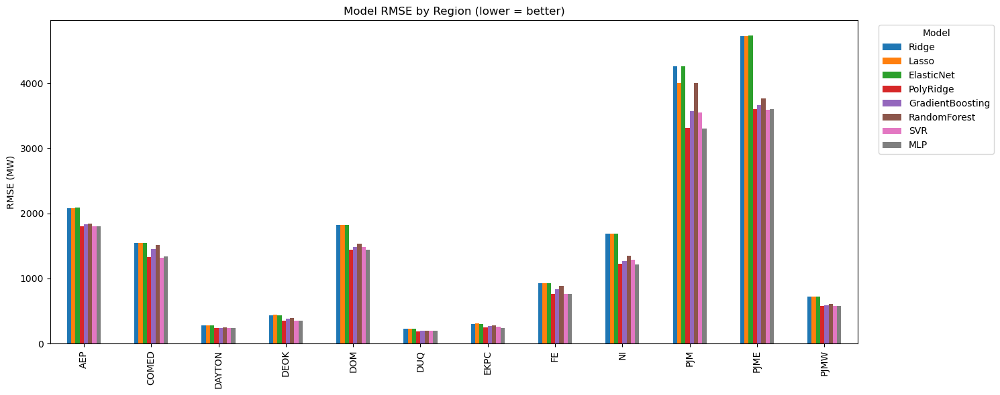

In [6]:
plt.figure(figsize=(12, 6))
rmse_df.plot(kind="bar", figsize=(15,6))
plt.title("Model RMSE by Region (lower = better)")
plt.ylabel("RMSE (MW)")
plt.legend(title="Model", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
plt.show()


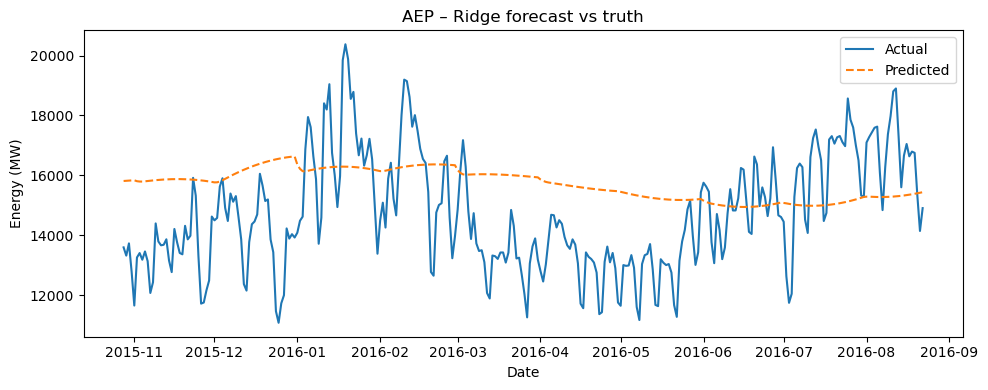

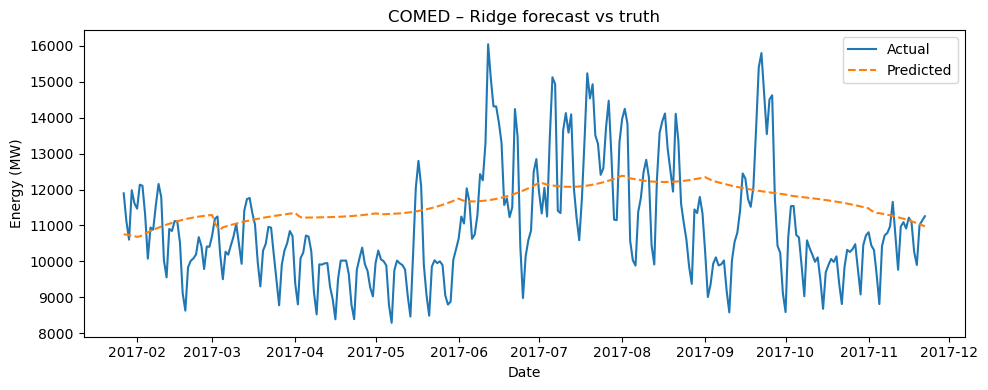

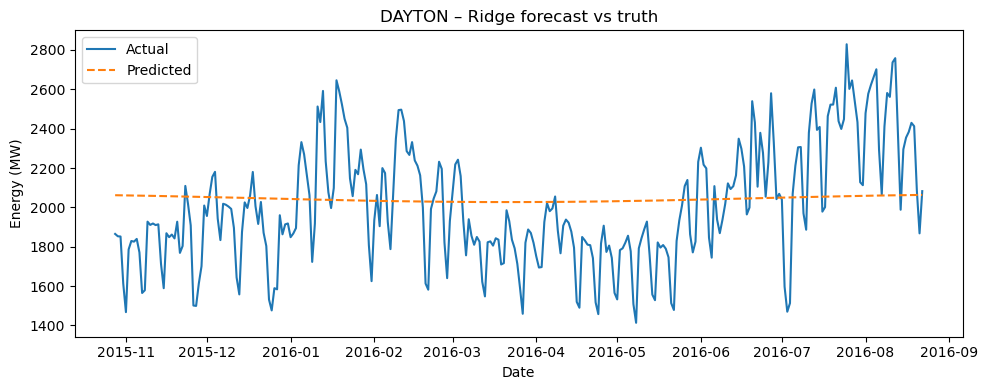

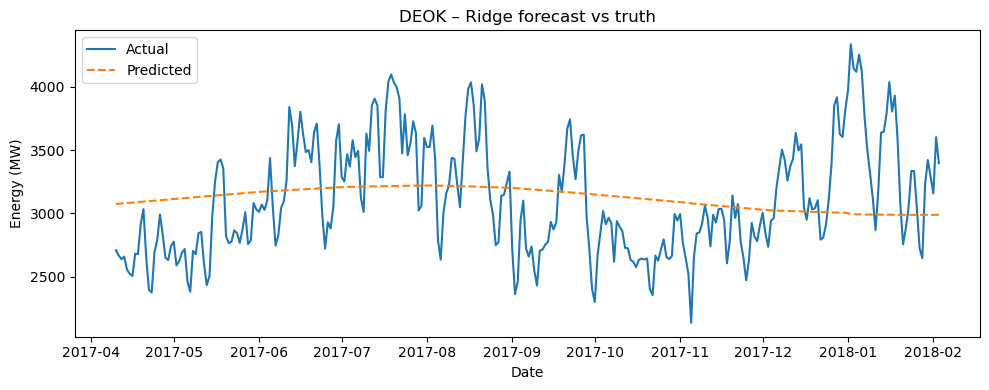

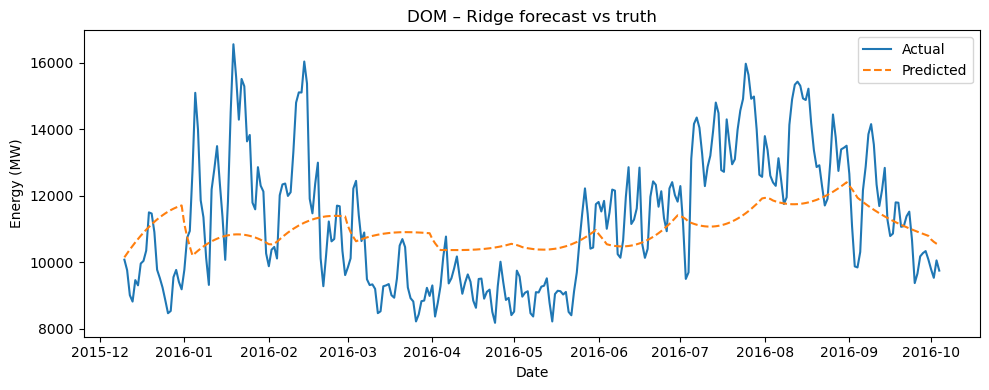

...

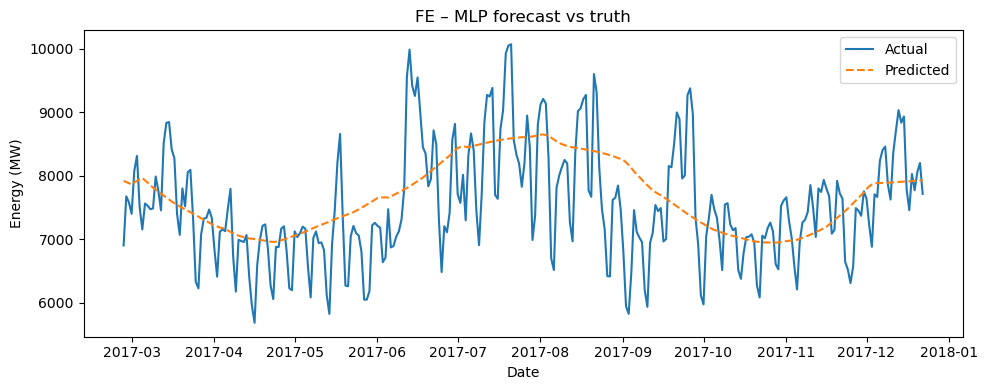

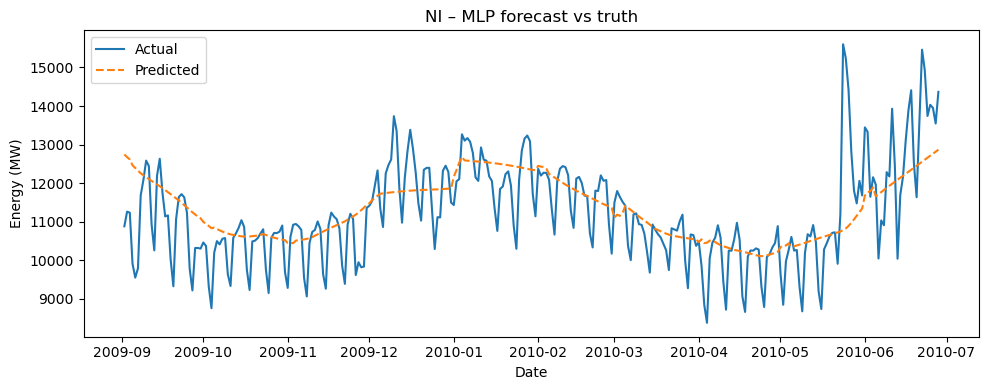

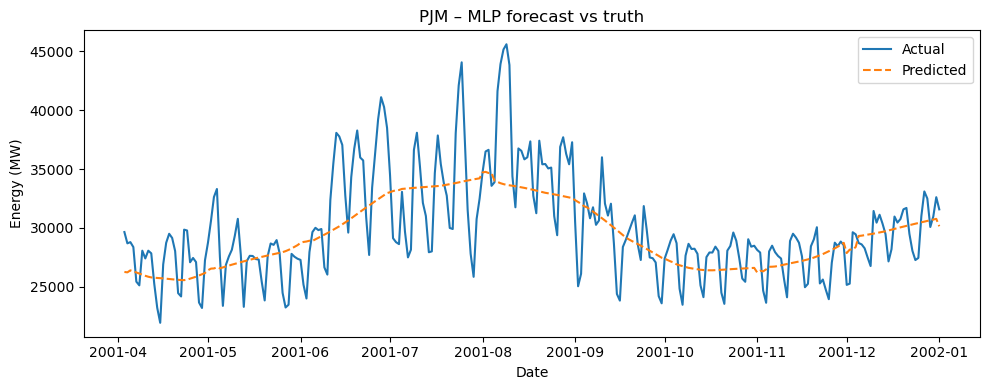

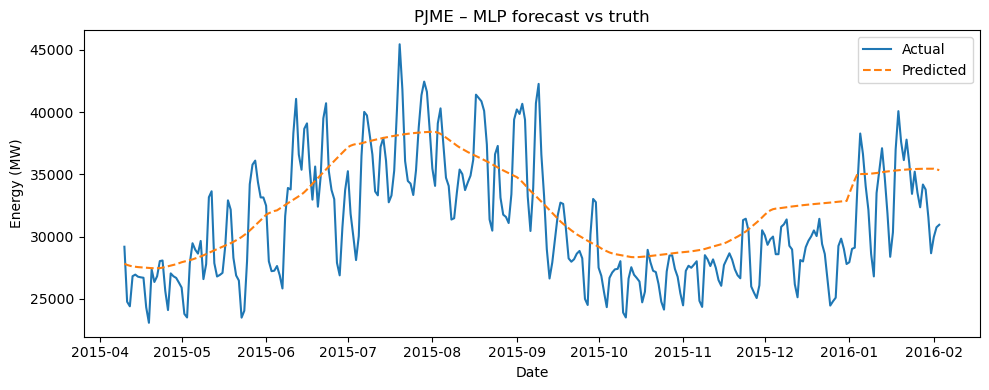

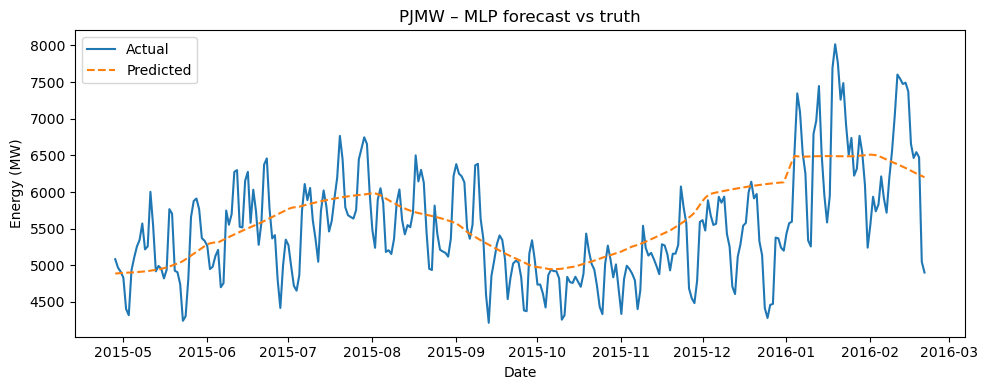

In [7]:
for model_name in rmse_df.columns:          # consistent ordering
    for region, splits in data_dict.items():
        mdl   = region_models[region][model_name]
        y_pred = mdl.predict(splits["X_test"])
        y_true = splits["y_test"]
        idx    = splits["index_test"]

        slc = slice(None) if N_POINTS is None else slice(0, N_POINTS)

        plt.figure(figsize=(10, 4))
        plt.plot(idx[slc], y_true[slc], label="Actual")
        plt.plot(idx[slc], y_pred[slc], label="Predicted", linestyle="--")
        plt.title(f"{region} – {model_name} forecast vs truth")
        plt.ylabel("Energy (MW)")
        plt.xlabel("Date")
        plt.legend()
        plt.tight_layout()
        plt.show()
